<a href="https://colab.research.google.com/github/Archin0/PCVK_Sem5/blob/main/Week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Persiapan Awal

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Transformasi Kecerahan (Linear Brightness)
Langkah ini mengimplementasikan penambahan atau pengurangan tingkat kecerahan pada gambar. Operasi ini menambahkan nilai kecerahan yang diinput ke setiap piksel gambar.

 Mengubah tingkat kecerahan citra 
 Masukkan nilai kecerahan: 10


/tmp/ipython-input-3469420973.py:25: RuntimeWarning: overflow encountered in scalar add
  brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


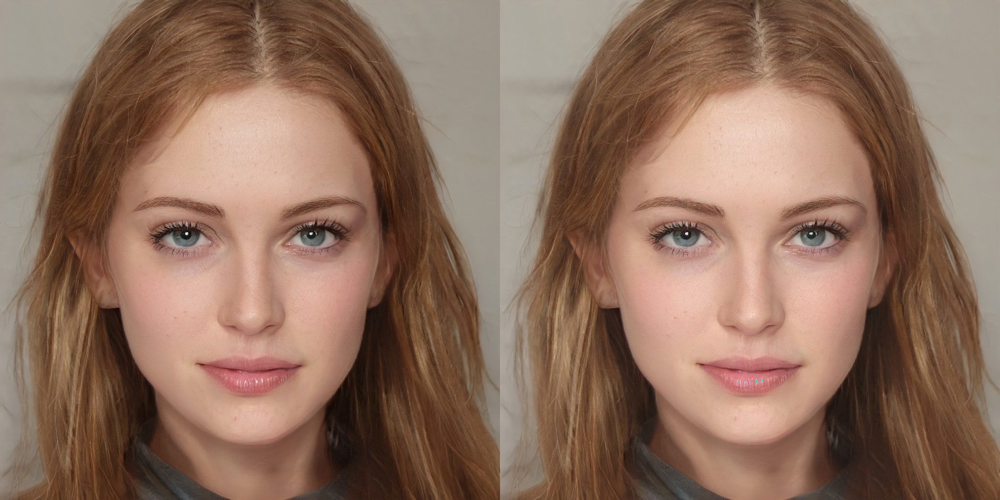

In [4]:
  # Import library yang dibutuhkan
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# --- Transformasi Linear Brightness ---
print(" Mengubah tingkat kecerahan citra ")
try:
    brightness = int(input(' Masukkan nilai kecerahan: '))
except ValueError:
    print("Error, bukan angka")

# Ganti dengan path file gambar Anda di Google Drive
original = cv2.imread('/content/drive/MyDrive/PCVK/female.jpg')

# Membuat gambar kosong dengan ukuran dan tipe data yang sama
brightness_image = np.zeros(original.shape, original.dtype)

# Mengakses setiap piksel
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            # Menambahkan nilai brightness dan memastikan nilainya tetap dalam rentang 0-255
            brightness_image[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

# Cara yang lebih sederhana tanpa loop
# brightness_image = cv2.convertScaleAbs(original, beta=brightness)

# Menampilkan gambar asli dan hasil
final_frame = cv2.hconcat((original, brightness_image))
cv2_imshow(final_frame)

## TUGAS 1
# Implementasi Image Inverse
Image inverse (gambar negatif) dibuat dengan mengurangi nilai 255 dengan nilai piksel asli.

Hasil Image Inverse:


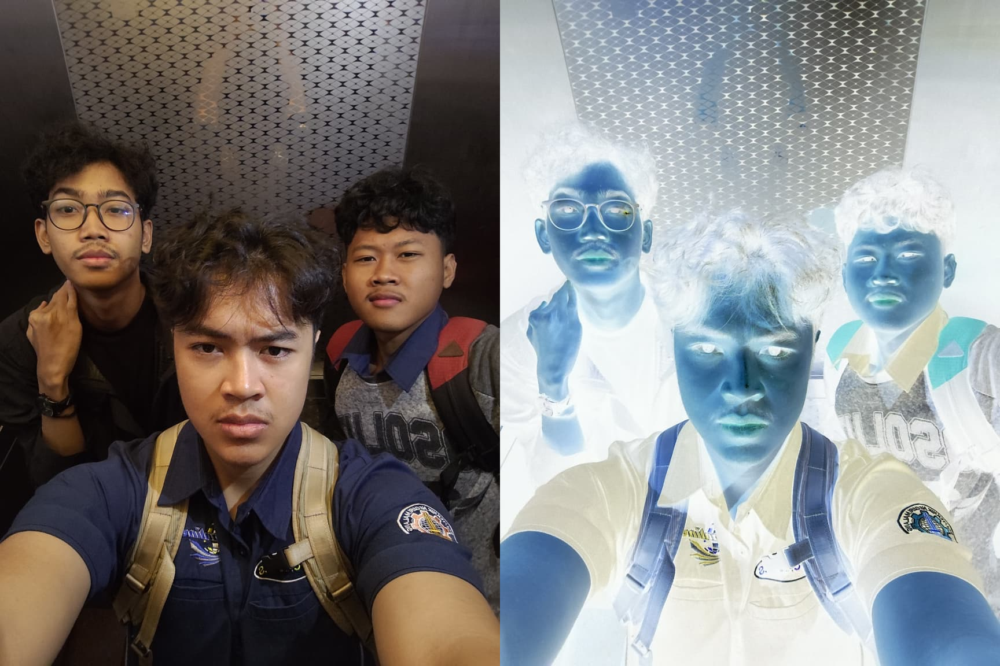

In [6]:
# --- Image Inverse ---
# Ganti dengan path file gambar Anda
img_path = '/content/drive/MyDrive/PCVK/team.jpg'
original_image = cv2.imread(img_path)

# Implementasi image inverse
inverted_image = 255 - original_image

# Menampilkan gambar asli dan hasil inverse
final_frame = cv2.hconcat((original_image, inverted_image))
print("Hasil Image Inverse:")
cv2_imshow(final_frame)

## TUGAS 2
## Implementasi Transformasi Kontras
Kontras menyesuaikan rentang penyebaran intensitas warna pada gambar.  Di sini, kita menggunakan formula yang lebih sederhana untuk mengatur kontras dan kecerahan secara bersamaan.

 Mengubah kontras dan tingkat kecerahan citra 
 Masukkan kontras [1.0 - 3.0]: 1.5
 Masukkan tingkat kecerahan [-255 - 255]: 20


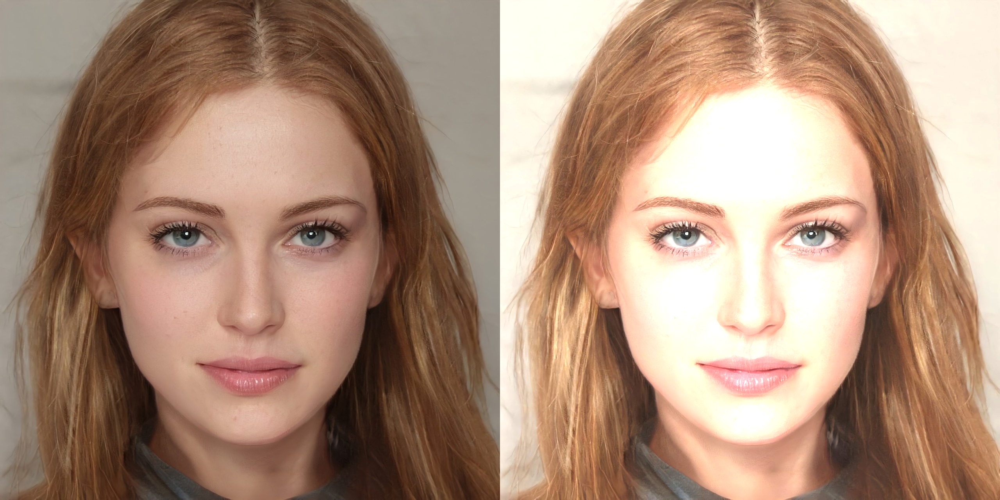

In [8]:
# --- Transformasi Kontras dan Kecerahan ---
print(" Mengubah kontras dan tingkat kecerahan citra ")
try:
    contrast = float(input(' Masukkan kontras [1.0 - 3.0]: '))
    brightness = int(input(' Masukkan tingkat kecerahan [-255 - 255]: '))
except ValueError:
    print("Error, input tidak valid")

# Ganti dengan path file gambar Anda
original_contrast = cv2.imread('/content/drive/MyDrive/PCVK/female.jpg')

# Menggunakan fungsi convertScaleAbs untuk mengatur kontras (alpha) dan kecerahan (beta)
contrast_image = cv2.convertScaleAbs(original_contrast, alpha=contrast, beta=brightness)

# Menampilkan gambar asli dan hasil
final_frame_contrast = cv2.hconcat((original_contrast, contrast_image))
cv2_imshow(final_frame_contrast)

## TUGAS 3
# Implementasi Transformasi Logaritmik
Transformasi logaritmik berguna untuk melebarkan rentang nilai warna yang sempit, terutama pada area gelap, agar lebih terlihat.


 Mengubah tingkat kecerahan citra dengan Transformasi Log 
 Masukkan nilai kecerahan: 35


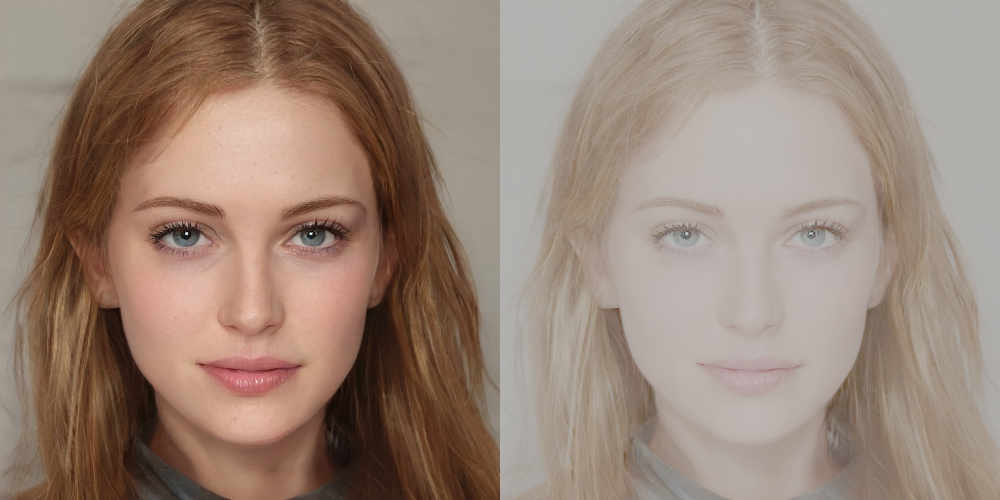

In [17]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

# --- Transformasi Logaritmik dengan Input Pengguna ---

print(" Mengubah tingkat kecerahan citra dengan Transformasi Log ")
try:
    # 1. Meminta input nilai kecerahan (yang akan menjadi konstanta c)
    c = int(input(' Masukkan nilai kecerahan: '))
except ValueError:
    print("Error, input yang dimasukkan harus berupa angka.")

# Ganti dengan path file gambar Anda
img_log = cv2.imread('/content/drive/MyDrive/PCVK/female.jpg')

# 2. Menerapkan transformasi logaritmik menggunakan nilai c dari input
# Pastikan gambar dikonversi ke float untuk perhitungan logaritma
log_transformed_image = c * np.log(1 + img_log.astype(float))

# 3. Normalisasi dan konversi kembali ke tipe data gambar (uint8)
# np.clip memastikan nilai tidak melebihi 255 atau kurang dari 0
log_transformed_image = np.clip(log_transformed_image, 0, 255)
log_transformed_image = np.array(log_transformed_image, dtype=np.uint8)

# Menampilkan gambar asli dan gambar hasil transformasi
final_frame = cv2.hconcat((img_log, log_transformed_image))
cv2_imshow(final_frame)

## TUGAS 4
## Implementasi Transformasi Grayscale
Berikut adalah implementasi tiga metode konversi gambar ke grayscale: Averaging, Lightness, dan Luminance.

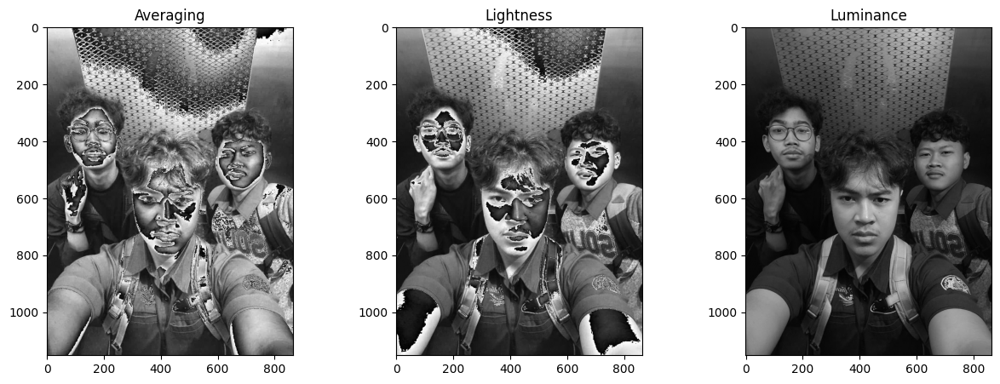

In [13]:
# --- Transformasi Grayscale ---
# Ganti dengan path file gambar Anda
img_gray_path = '/content/drive/MyDrive/PCVK/team.jpg'
img_to_gray = cv2.imread(img_gray_path)
img_rgb_gray = cv2.cvtColor(img_to_gray, cv2.COLOR_BGR2RGB)

# Ekstrak channel R, G, B
r, g, b = img_rgb_gray[:,:,0], img_rgb_gray[:,:,1], img_rgb_gray[:,:,2]

# 1. Metode Averaging
# Grayscale_avg = (R+G+B) / 3 [cite: 483]
gray_avg = (r + g + b) / 3

# 2. Metode Lightness
# Grayscale_lightness = (max(R,G,B) + min(R,G,B)) / 2 [cite: 484, 485, 486]
gray_lightness = (np.maximum(np.maximum(r,g),b) + np.minimum(np.minimum(r,g),b)) / 2

# 3. Metode Luminance (Luminosity)
# Grayscale_luminance = 0.21R + 0.72G + 0.07B [cite: 487]
gray_luminance = 0.21 * r + 0.72 * g + 0.07 * b

# Menampilkan semua hasil
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].imshow(gray_avg, cmap='gray')
axs[0].set_title('Averaging')

axs[1].imshow(gray_lightness, cmap='gray')
axs[1].set_title('Lightness')

axs[2].imshow(gray_luminance, cmap='gray')
axs[2].set_title('Luminance')

plt.show()